# End-to-end Multi-class Dog Breed classification

This notebook builds an end-to-end image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog. Can identify between 120 dogs.

When I'm sitting at the cafe and I take a photo of a dog I can find out what breed it is.

## 2. Data

The data we are using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructred data) so its provably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are 10,000+ images in the training set (these images have labels)
* There are 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
# This was used to unzip the data folder into google drive
#!unzip "drive/MyDrive/Dog vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog vision/"

#NOTE: To change code to markdown press command then double tap m
# To view docstrings use command, shift, then space

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF Hub version:",hub.__version__)

# Check for GPU availability
print("GPU","available (YES!)" if tf.config.list_physical_devices("GPU") else "not available :(")

#To ascess GPU go to runtime tab in google colab.
#runtime>change runtime type>Python 3 and set hardware acceo to GPU

# If runtime disconnects or restarting notebook:
# - Need to re-run every cell and variables, go to runtime>run all


TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (YES!)


## Getting our data ready (turning into Tensors)

With all machine learning modems, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Lets start be accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


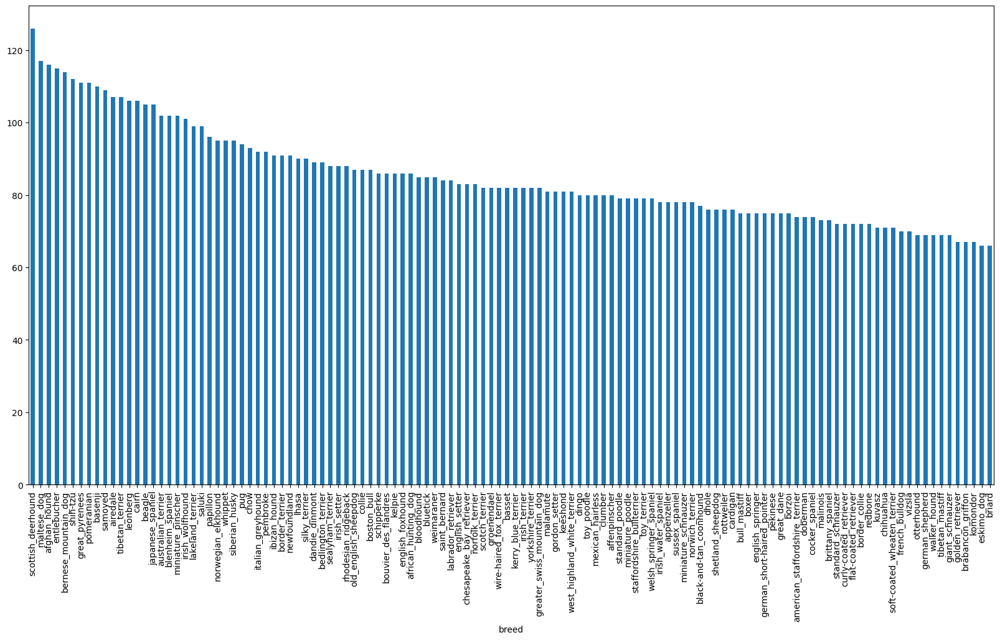

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

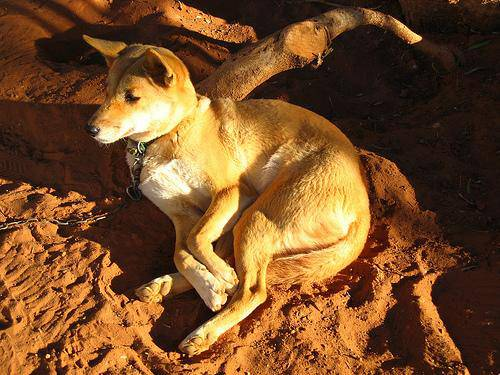

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames=["drive/MyDrive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check first 10
filenames[:3]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg']

In [ ]:
#Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog vision/train/")) == len(filenames):
  print("Filenames match actual amount of files! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files! Proceed.


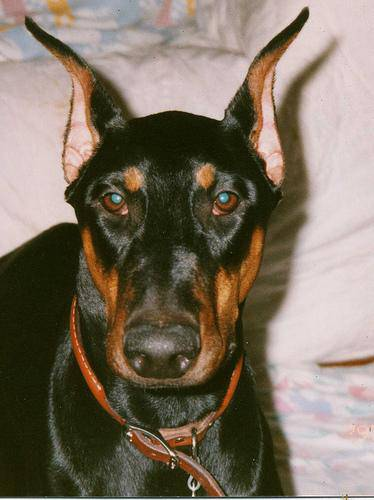

In [ ]:
# One more check
Image(filenames[9001])

In [ ]:
labels_csv["breed"][9001]

'doberman'

Since we've now got our training image filepaths in a list, lets prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels=np.array(labels) # does same thign as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of filenames
if len(labels)== len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match the number of filenames.")

Number of labels matches number of filenames!


In [ ]:
# Find the unqiue label values
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array of 10222 bool arrays
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Examaple: Turning boolean array into intergers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup x 7 y variables
x= filenames
y=boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into train and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val=train_test_split(x[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
# Lets have a look at the training data
x_train[:2],y_train[:2]

(['drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalized our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

Before we do, lets see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
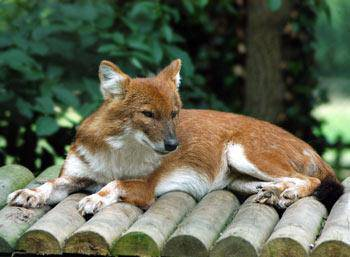

In [ ]:
image

In [ ]:
# RBG values are between 255 and 0
image.max(),image.min()

(255, 0)

In [ ]:
# Create tensor object by using tf
tf.constant(image) #The only difference here, is we have it in a tensor "tf.Tensor: shape...."

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, lets make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalized our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the iamge into a Tensor.
  """
  #Read in an image file
  image=tf.io.read_file(image_path)
  # Turn the jpeg into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image=tf.image.decode_jpeg(image,channels=3) #channels = 3 for RGB
  # NORMALIZE
  #Convert the color channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value (224, 224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say your trying to process 10, 000+ images in one go... they might not all fit into  memory.

So thats why we do about 32 (batch size) images at a time (you can manually adjust the batch size if need be)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label, processes the image and returns a tuple of (image,label).
  """
  image=process_image(image_path)
  return image,label

In [ ]:
# Demo of above
(process_image(x[42]), tf.constant(y[42])) # Creates tuple of image, label pair

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image,label)` let's make a function to turn all of our data (`x` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data, but doesn't shuffle if it's validation data.
  Also accepts test data as input (hence y set to none as default as test data here has no labels).
  """
  # If data is test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #Only accepts filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If that data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                               tf.constant(y)))# labels
    # Creates (image, label) tuples (this also turn the image path into a preprocessed image)
    data_batch= data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                               tf.constant(y)))# labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    # Creates (image, label) tuples (this also turn the image path into a preprocessed image)
    data = data.map(get_image_label)#shuffle before this step

    #Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch


In [ ]:
# Create trainign and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# First line is the img with Batch size equal to none because its flexible, shape of 224,224,3

## Visualizing Data batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and thier labels from a data batch.
  """
  # Set up a figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1) #rows,cols,index
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()]) #labels in a bool array, arg max finds wheres the one TRUE statement
    #so returns then the index of what label it is in unique breeds
    # Turn the gird lines off
    plt.axis("off")

In [ ]:
# Show the logic behind line above
unique_breeds[y[0].argmax()],  y[0].argmax(),  y[0]

('boston_bull',
 19,
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]))

In [ ]:
# Will need to unbatch the data to properly visualize it, but first lets look at the data
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# If we go to train data need to turn into an iterator
#First takes the batch data then turns into numpy iterator, then grabs the first batch from the iterator
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.36764377, 0.39509478, 0.43431047],
          [0.36354113, 0.38723686, 0.4339631 ],
          [0.37741536, 0.40094477, 0.4480036 ],
          ...,
          [0.28807318, 0.335132  , 0.38219082],
          [0.30033377, 0.34739262, 0.39445144],
          [0.28327942, 0.33033827, 0.3773971 ]],
 
         [[0.35903418, 0.3825636 , 0.4296224 ],
          [0.39209116, 0.41562057, 0.46267942],
          [0.38839617, 0.41192558, 0.4589844 ],
          ...,
          [0.30497584, 0.35203466, 0.3990935 ],
          [0.30664384, 0.35370266, 0.40076151],
          [0.30772942, 0.35478824, 0.4018471 ]],
 
         [[0.39619592, 0.41972533, 0.46678415],
          [0.3711609 , 0.39469033, 0.44174916],
          [0.34829062, 0.37182006, 0.41887888],
          ...,
          [0.31213713, 0.35919595, 0.40688506],
          [0.32050055, 0.3675594 , 0.41524848],
          [0.3302519 , 0.37731075, 0.42499983]],
 
         ...,
 
         [[0.62222064, 0.6418285 , 0.6535932 ],
          [0.61068

In [ ]:
len(train_images),len(train_labels) #Batch size of 32

(32, 32)

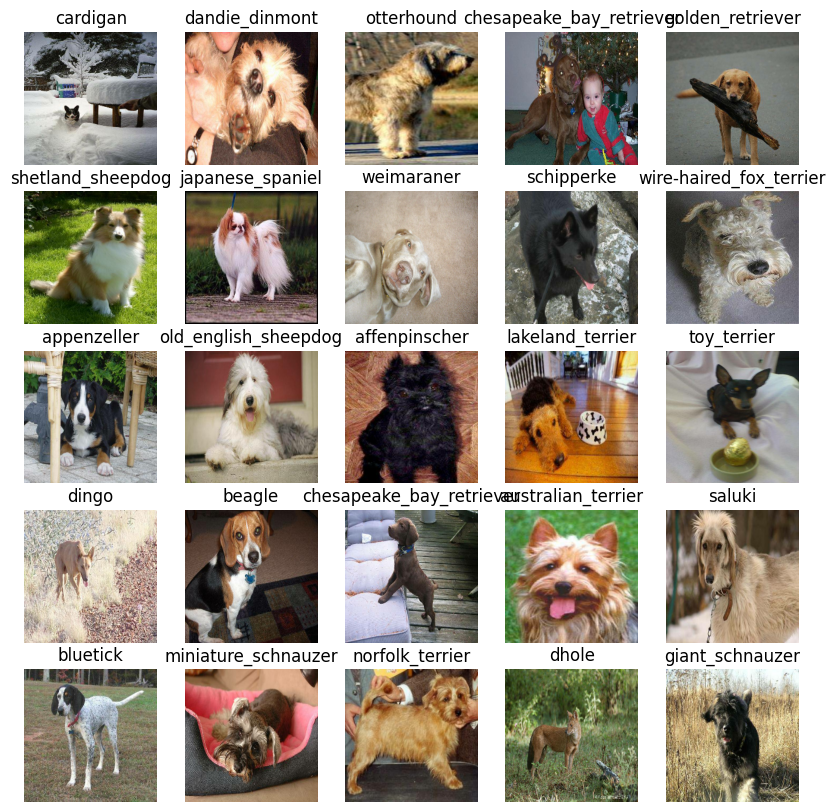

In [ ]:
# Now lets visualize the data in a training batch
show_25_images(train_images,train_labels)

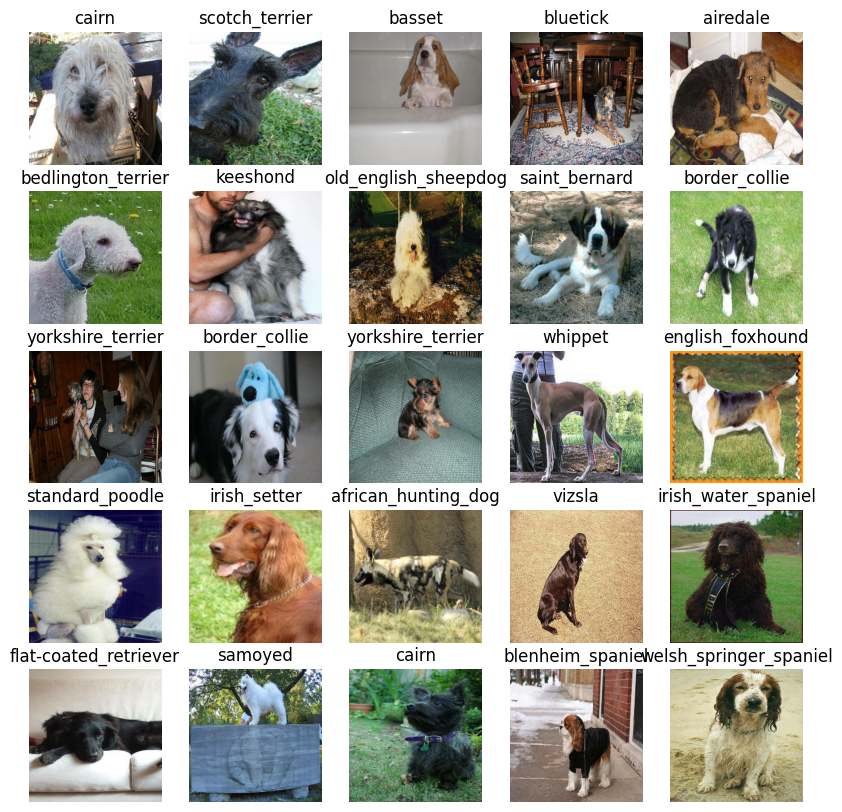

In [ ]:
# Nows lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few thing we need to define:
* The input shape (our images shape, on the form of Tensors) to our model.
* The output shape (image, labels, in the form of Tensor) of our model.
* The URL of the model we want to use. https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification


In [ ]:
# Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #Batchs, height, widths, color channels

# Setup output shape of our model
OUTPUT_SHAPE= len(unique_breeds) #120

# Setup model URL from TensorFlow Hub
MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved)
* Builds the models (tells the model the input shape it will be getting). Found
* Returns the model.

https://www.tensorflow.org/guide/keras for all the steps explained.
https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification for where to find what to type to build and etc.

In [ ]:
# Create a function which buildsa Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building a model with:", MODEL_URL)

  # Setup the model layers
  # Sequntial is a linear stack of layers that finds patterns in that input, and find an output
  # Mobilenet's architecture will eventually spits out 1x1x1280, instead of this though
  # We specify our output to be in shape of outputshape=120 unqiue dog labels
  # softmax: after applying softmax each component will be in the interval (0,1) and compontnets will add to 1
  #The highest number will be our label
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (Inout layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") #layer 2 (output layer)

      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Loss is measure of how well the model is guessing

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building a model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
# Found 532713 paterns that we can use to train 120240 paramters

## Creating callbacks

Callbacks are helper functions a model can use during training todo such things as save its progress or stop training early if a model stops improving

We'll create two callbacks, one for TensorBoard which help track our models progress and another for early stopping which prevents our model from training too long.

### TensorBoard Callback

To setup a TensorBoard callback we need todo 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magiv function (we'll do after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
#Creat a function to build a Tensorboard callback
def create_tensorboard_callback():
  # log dir for storing TensorBoard logs
  logdir=os.path.join("drive/My Drive/Dog vision/logs",
                      # Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) #year,mon,day,hout,min,sec
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stopping helps our model from overfitting by stopping training training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [ ]:
# Create early stopping callback
# patience is the number of epoch withouth improvement that it will tolerate until stoppage
# epochs is how many passes of the data we want our model todo
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
# Check to make sure we're still running on GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model.

* Create model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we would like to use
* Retrun the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model=create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data, passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, #test patterns on data every epochs once
            callbacks=[tensorboard,early_stopping])
  # Return the fitten model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building a model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 373s 15s/step - loss: 4.5411 - accuracy: 0.0887 - val_loss: 3.2775 - val_accuracy: 0.3000
Epoch 2/100
25/25 [==============================] - 6s 235ms/step - loss: 1.6039 - accuracy: 0.6888 - val_loss: 2.1144 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 6s 220ms/step - loss: 0.5463 - accuracy: 0.9388 - val_loss: 1.6527 - val_accuracy: 0.6400
Epoch 4/100
25/25 [==============================] - 8s 299ms/step - loss: 0.2492 - accuracy: 0.9862 - val_loss: 1.4944 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 9s 348ms/step - loss: 0.1475 - accuracy: 0.9962 - val_loss: 1.4194 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 10s 378ms/step - loss: 0.1000 - accuracy: 1.0000 - val_loss: 1.3671 - val_accuracy: 0.6650
Epoch 7/100
25/25 [============

In [ ]:
#If the model is learning the loss should go down and accuracy should go up

**Question:** It looks like our model is overfitting because it's performing far better on the training datasetthan the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

We see this as its performing better on the data set than the validation data set

**Note:** Overfitting to begin with is a good thing. Means out model is learning

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Make and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,verbose=1) #verbose means when making predictions, show progress
predictions

7/7 [==============================] - 2s 161ms/step


array([[4.82291356e-03, 3.50588612e-04, 4.51357133e-04, ...,
        4.17887844e-04, 2.32923667e-05, 2.39624525e-03],
       [5.48868440e-03, 3.45815235e-04, 4.21980256e-03, ...,
        8.23317911e-04, 1.26211077e-03, 4.37851966e-04],
       [1.81426265e-04, 6.70789916e-04, 9.89100590e-06, ...,
        3.31556599e-04, 4.04876955e-05, 1.17342774e-04],
       ...,
       [1.55799189e-05, 2.08616708e-04, 5.50831137e-05, ...,
        1.19894845e-04, 1.47336698e-03, 2.24788280e-04],
       [4.44577541e-03, 2.48902681e-04, 1.07327622e-04, ...,
        2.04325319e-04, 1.05278217e-04, 8.18921067e-03],
       [4.01702855e-04, 1.34621499e-04, 2.45325710e-03, ...,
        2.71701440e-03, 3.10598477e-03, 7.70143408e-04]], dtype=float32)

In [ ]:
# Show pred for first image of validation data
predictions[0] # The biggest number coresponds to what label it predicts the most

array([4.82291356e-03, 3.50588612e-04, 4.51357133e-04, 3.38695827e-05,
       6.12376316e-04, 3.77545657e-05, 7.73574971e-03, 1.06911408e-03,
       3.86050786e-04, 4.12476889e-04, 2.35206884e-04, 2.16758810e-04,
       1.17291442e-04, 1.03972206e-05, 1.03072368e-03, 5.97471197e-04,
       1.40351243e-04, 2.65637487e-01, 3.24240355e-05, 8.87696660e-05,
       2.18400941e-03, 7.00780802e-05, 1.82857693e-05, 1.06631790e-03,
       8.01812566e-05, 3.52374889e-04, 7.22510815e-02, 1.67873543e-04,
       6.02786604e-04, 2.29299971e-04, 2.60138593e-04, 1.04916422e-03,
       3.90102970e-04, 4.78005823e-05, 5.60434310e-05, 6.65346831e-02,
       3.13345190e-05, 1.58635550e-04, 7.86262171e-05, 5.40081419e-05,
       2.12970888e-04, 1.91588661e-05, 2.89579784e-05, 1.57470859e-04,
       3.44421132e-05, 6.24641107e-05, 1.35308455e-05, 2.97815481e-04,
       1.74757763e-04, 1.03214807e-04, 6.00470405e-04, 1.94157590e-04,
       1.07503578e-03, 3.62000974e-05, 9.62174163e-05, 1.28197435e-05,
      

In [ ]:
len(predictions[0]), np.sum(predictions[0])
#This is becasue of softmax, gives each label a prob, and each in range (0,1)

(120, 0.9999999)

In [ ]:
# First prediction
index=0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.82291356e-03 3.50588612e-04 4.51357133e-04 3.38695827e-05
 6.12376316e-04 3.77545657e-05 7.73574971e-03 1.06911408e-03
 3.86050786e-04 4.12476889e-04 2.35206884e-04 2.16758810e-04
 1.17291442e-04 1.03972206e-05 1.03072368e-03 5.97471197e-04
 1.40351243e-04 2.65637487e-01 3.24240355e-05 8.87696660e-05
 2.18400941e-03 7.00780802e-05 1.82857693e-05 1.06631790e-03
 8.01812566e-05 3.52374889e-04 7.22510815e-02 1.67873543e-04
 6.02786604e-04 2.29299971e-04 2.60138593e-04 1.04916422e-03
 3.90102970e-04 4.78005823e-05 5.60434310e-05 6.65346831e-02
 3.13345190e-05 1.58635550e-04 7.86262171e-05 5.40081419e-05
 2.12970888e-04 1.91588661e-05 2.89579784e-05 1.57470859e-04
 3.44421132e-05 6.24641107e-05 1.35308455e-05 2.97815481e-04
 1.74757763e-04 1.03214807e-04 6.00470405e-04 1.94157590e-04
 1.07503578e-03 3.62000974e-05 9.62174163e-05 1.28197435e-05
 8.34410239e-05 6.96227420e-03 5.01111383e-04 2.95009226e-01
 3.12449265e-04 9.55860378e-06 2.17485079e-03 3.50808172e-04
 3.14502191e-04 2.404856

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilites are also known as confidence levels.

In [ ]:
# Turn predictions probabilities into their respective lavel (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatchifiy it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays of images and labels.
  """
  images=[]
  labels=[]
  #loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Vaidation images

Lets make some functions to make these all a abit for visualized.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and interger.
* Converrt prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single splot.

In [ ]:
def plot_pred(predictions_probabilities,labels,images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = predictions_probabilities[n], labels[n],images[n]

  # GEt the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([]) # Emtpy list to turn it off
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color="green"
  else:
    color="red"


  # Chat plot title to be predicted, prob of pred, and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)



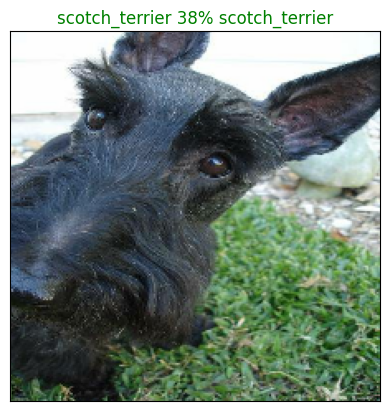

In [ ]:
plot_pred(predictions_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Now we've got one function to visualize our models top prediction, let's make another to iew our models top 10 predictions.

This function will:
* Take an input of prediction proabilities array and a ground truth array and an interger
* Find the predcition using `get_pred_label(_)`
* Find the top 10:
  * Prediction probabilities indexs
  * Prediction probabilities values
  * Prediction labels
*Plot the top 10 prediction probability values and labels, coloring the true label green.


In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change colour of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



In [ ]:
# explaining logic above
predictions[0].argsort() # Gives array of indexes used to sort predictions srray

array([ 61,  13,  55,  46,  22,  41, 112, 118,  82, 115,  42, 108,  36,
        18,  75,   3,  44,  53,   5,  92,  99,  84,  33,  39,  34,  45,
       113,  21, 111, 107,  38,  24,  94,  56,  19,  54, 101,  49,  67,
        91,  66,  12,  16, 104,  43,  37,  69,  27,  48,  51,  40,  11,
       105,  29,  10,  30,  47,  95,  60,  64,  71,  87,   1,  63,  25,
        86,  88,   8,  32,   9, 117,   2, 114,  58,  74,  72,  15,  50,
        28,   4,  80,  85,  78,  98,  89,  14,  31,  23,   7,  52,  81,
        90,  68, 110,  62,  20, 119,  96, 109, 100,   0, 116,  93,  57,
         6, 106, 103,  83,  97,  79,  73, 102,  76,  65,  70,  77,  35,
        26,  17,  59])

In [ ]:
predictions[0].argsort()[-10:][::-1] # -10 gives us the top 10 and ::-1 to reverse the order so 1->10 inseatd of 10->1 in terms of size

array([ 59,  17,  26,  35,  77,  70,  65,  76, 102,  73])

In [ ]:
# display top 10
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.29500923, 0.2656375 , 0.07225108, 0.06653468, 0.06552624,
       0.04703386, 0.02404857, 0.01264394, 0.01250994, 0.01145319],
      dtype=float32)

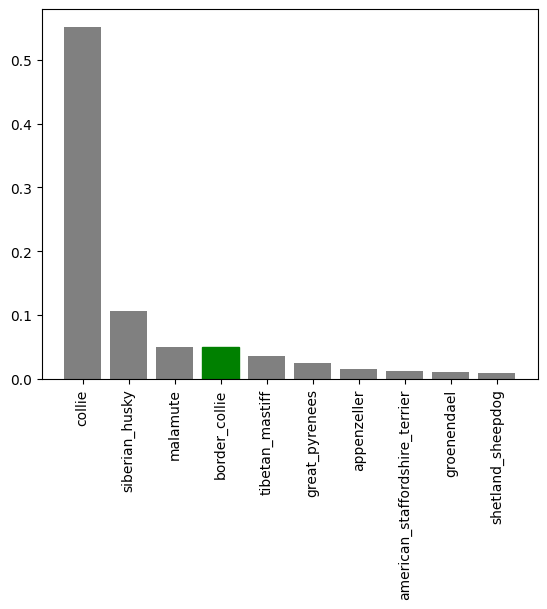

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Looking above can see most predicted breed was collie, but actual label was border_collie

Now we've got sume function to help us visualize our predictions and evaluate our model, lets check out a few.

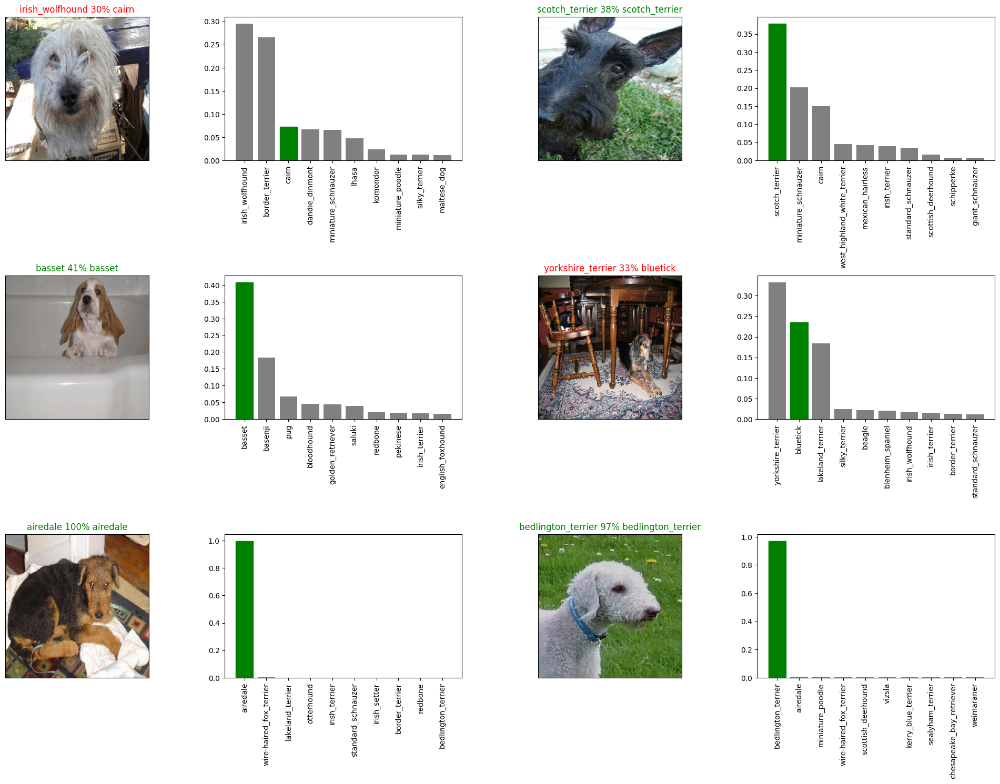

In [ ]:
# Lets check out a few predictions and their different values
i_multiplier = 0
num_rows= 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show() # keep this out of the for loop

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

Info here: https://www.tensorflow.org/tutorials/keras/save_and_load

In [ ]:
# Create a function to save a model
# suffix is for letting people know how many images its trained and other info like mobilenet or Adam
# h5 is save format of model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/ My Drive/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+ "-"+suffix+".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model fro ma specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model= tf.keras.models.load_model(model_path,
                             custom_objects={"KerasLayer" :hub.KerasLayer})#need custom object for irregualr layer in model, usually assumes easiest usecases
                             # We did above becayse of the layer we added in creade_model function, the line hub.KerasLayer(MODEL_URL) specifically

  return model

No we have functions to load and save a model, lets make sure they work.

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/ My Drive/Dog vision/models/20240606-02231717640639-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/ My Drive/Dog vision/models/20240606-02231717640639-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load trained model
loaded_1000_image_model=load_model("drive/ My Drive/Dog vision/models/20240605-21421717623775-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/ My Drive/Dog vision/models/20240605-21421717623775-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 119ms/step - loss: 1.2775 - accuracy: 0.6650


[1.2775417566299438, 0.6650000214576721]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 122ms/step - loss: 1.3078 - accuracy: 0.6350


[1.3078285455703735, 0.6349999904632568]

## Training a big dog model (on the full data)

In [ ]:
# File names, labels
len(x),len(y)

(10222, 10222)

In [ ]:
# First 10
x[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#And splited into train and val with train having 800
len(x_train),x_train[:10]

(800,
 ['drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
  'drive/MyDrive/Dog vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
  'drive/MyDrive/Dog vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
  'drive/MyDrive/Dog vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
  'drive/MyDrive/Dog vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
  'drive/MyDrive/Dog vision/train/143b9484273e57668d03bfc26755810a.jpg'])

In [ ]:
y[1]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Creaye a data batch with full data set
# Turns x(filepaths),y(labels) into tensors, shuffles, maps our processing image function and get_label function to the data
# Turns data into batch size of 32
full_data=create_data_batches(x,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model=create_model()

Building a model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback() #track performance of model to comapre agaisnt other
# No validation set when training on all the data, so we cant monitor validation accuracy
# So need another type of early stopping
full_model_early_stopping= tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

**NOTE:** Running cell below will take a little while (maybe up to 30 min for first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

This is why we used a small dataset at first, to see if it works without waiting 30 min every time.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 54s 155ms/step - loss: 1.3309 - accuracy: 0.6640
Epoch 2/100
320/320 [==============================] - 51s 159ms/step - loss: 0.3977 - accuracy: 0.8852
Epoch 3/100
320/320 [==============================] - 48s 151ms/step - loss: 0.2381 - accuracy: 0.9348
Epoch 4/100
320/320 [==============================] - 47s 147ms/step - loss: 0.1521 - accuracy: 0.9646
Epoch 5/100
320/320 [==============================] - 47s 147ms/step - loss: 0.1075 - accuracy: 0.9785
Epoch 6/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0764 - accuracy: 0.9873
Epoch 7/100
320/320 [==============================] - 48s 149ms/step - loss: 0.0600 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 48s 149ms/step - loss: 0.0465 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 48s 148ms/step - loss: 0.0369 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 48s 151m

In [ ]:
save_model(full_model,suffix="full_image-mobilenetv2-Adam")

Saving model to: drive/ My Drive/Dog vision/models/20240606-02411717641675-full_image-mobilenetv2-Adam.h5...


'drive/ My Drive/Dog vision/models/20240606-02411717641675-full_image-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model("drive/ My Drive/Dog vision/models/20240605-22311717626669-full_image-mobilenetv2-Adam.h5")

Loading saved model from: drive/ My Drive/Dog vision/models/20240605-22311717626669-full_image-mobilenetv2-Adam.h5


## Making predictions on the test dataset in the test folder

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert filenames into test data batches using `create_data_batches()` and setting the `test_data` paramter to `True` (since the test daya doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog vision/test/5e288dc22811b371d6d7e42fd5861af3.jpg',
 'drive/MyDrive/Dog vision/test/5e3c2a49bbbb34ce3d83457aad7c38e7.jpg',
 'drive/MyDrive/Dog vision/test/5e30cbb0843a17388aed59904b3c9eb3.jpg',
 'drive/MyDrive/Dog vision/test/5e528cfc3e6a3dfdf660fa86c6b8b1be.jpg',
 'drive/MyDrive/Dog vision/test/5e593fd2bbde69cc3a30d7cdec1663c6.jpg',
 'drive/MyDrive/Dog vision/test/5e5d3216461e2fd1c0e9b76c5a1f5c9c.jpg',
 'drive/MyDrive/Dog vision/test/5e5f77203e5be99fef50148335f95e69.jpg',
 'drive/MyDrive/Dog vision/test/5e60bd302fa1c348031aeef1b95a5f6f.jpg',
 'drive/MyDrive/Dog vision/test/5e6577355e0efdfa3d2c765f60ffef74.jpg',
 'drive/MyDrive/Dog vision/test/5e60d8ea5a1bfdb0265ece516acb5ba0.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE:** Calling predict on full model and passing it the test data batch can take a long time to run (about 1 hour)

In [ ]:
# Make predictions on test data btach using the loaded full model
test_predictions=loaded_full_model.predict(test_data,
                                   verbose=1)

324/324 [==============================] - 231s 700ms/step


In [ ]:
# Save predictions (NumPy array) from csv file
np.savetxt("drive/My Drive/Dog vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_precictions = np.loadtxt("drive/My Drive/Dog vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.7562775e-08, 3.4641204e-07, 1.2754237e-08, ..., 6.7241494e-06,
        7.1224306e-08, 1.4341068e-08],
       [2.1590199e-09, 3.1346401e-09, 1.3604884e-08, ..., 3.0128106e-10,
        1.9390743e-07, 3.1680369e-08],
       [1.5452390e-07, 6.0614148e-08, 1.2432874e-07, ..., 3.4522131e-07,
        9.1399264e-01, 2.0444159e-06],
       ...,
       [5.0774447e-09, 2.9170397e-12, 1.6457159e-09, ..., 3.5050010e-10,
        7.6214417e-11, 5.8785303e-11],
       [1.9420583e-10, 4.0936867e-09, 3.3212680e-10, ..., 2.0879083e-10,
        1.3414563e-05, 5.7883383e-09],
       [1.4434510e-08, 2.0517012e-07, 1.1874727e-06, ..., 9.2938237e-08,
        8.0585710e-07, 1.5224979e-09]], dtype=float32)

In [ ]:
# So have 10000+ images and each as 120 prediction probabilities
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions or Kaggle (Making a csv out of it following the competitions requirments)

Looking at the Kaggle sample submission, we find that it wants our models prdiction probability outputs in a DataGrame with an ID and an column for each different dog breed. https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well s a column for each dog breed
* Add data to the ID column by extrracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit to Kaggle.

In [ ]:
["id"]+list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# Create a pandas Dataframe
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_path

'drive/MyDrive/Dog vision/test/'

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog vision/test/5e288dc22811b371d6d7e42fd5861af3', '.jpg')

In [ ]:
# append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['5e288dc22811b371d6d7e42fd5861af3',
 '5e3c2a49bbbb34ce3d83457aad7c38e7',
 '5e30cbb0843a17388aed59904b3c9eb3',
 '5e528cfc3e6a3dfdf660fa86c6b8b1be',
 '5e593fd2bbde69cc3a30d7cdec1663c6',
 '5e5d3216461e2fd1c0e9b76c5a1f5c9c',
 '5e5f77203e5be99fef50148335f95e69',
 '5e60bd302fa1c348031aeef1b95a5f6f',
 '5e6577355e0efdfa3d2c765f60ffef74',
 '5e60d8ea5a1bfdb0265ece516acb5ba0',
 '5e75eb058a109d912b19e1b33e03a22b',
 '5e7411d19f15843b0260f48b65f77932',
 '5e6f165a07053d945698d3e0dbdfc50d',
 '5e7b97a1965af05b3d8261bed8ce740a',
 '5e65ceb8d66a901246ca3a88bc2db930',
 '5e7ca529f7a5a55066db4b5f2214d6af',
 '5e7cc2bdbcce307838c4cffecfc7d426',
 '5e84861d51146d255e0da8d775127992',
 '5e84c23ad5c786094160b403c643e960',
 '5e86f7f7828f9e5c9ac5771fb6200a5f',
 '5e8a978ab8ab47bfb3ff4dd6f41a2f54',
 '5e9b8fa5bc42071cc7e419341fcd7a7a',
 '5ea2bfe5118913988721a585ecc7ecfa',
 '5ea3d4496c5ba202f9c9619520eb15cf',
 '5eac5a257485897e8c92cface1b2f110',
 '5eaec75a4cc37e21772de348ab080c78',
 '5eb3573da1c60c5b057ab77b9bfa4418',
 

In [ ]:
# Make id columsn with test_ids
preds_df["id"]=test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,5e288dc22811b371d6d7e42fd5861af3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5e3c2a49bbbb34ce3d83457aad7c38e7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5e30cbb0843a17388aed59904b3c9eb3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5e528cfc3e6a3dfdf660fa86c6b8b1be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5e593fd2bbde69cc3a30d7cdec1663c6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed columns
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,5e288dc22811b371d6d7e42fd5861af3,4.756278e-08,3.464120e-07,1.275424e-08,2.635550e-07,1.442727e-08,5.039355e-06,6.132657e-10,1.829558e-08,1.991914e-05,...,1.001871e-06,3.187296e-06,5.706178e-04,2.286765e-07,6.621524e-04,1.300147e-09,3.583507e-09,6.724149e-06,7.122431e-08,1.434107e-08
1,5e3c2a49bbbb34ce3d83457aad7c38e7,2.159020e-09,3.134640e-09,1.360488e-08,1.417578e-10,1.000435e-08,4.881903e-07,6.988803e-07,3.108912e-07,2.031319e-10,...,1.055929e-07,2.823774e-08,7.177551e-12,6.352109e-08,4.922762e-08,5.432682e-10,6.033189e-07,3.012811e-10,1.939074e-07,3.168037e-08
2,5e30cbb0843a17388aed59904b3c9eb3,1.545239e-07,6.061415e-08,1.243287e-07,1.201421e-05,2.403016e-04,8.794899e-08,2.368904e-06,8.750662e-07,3.469602e-08,...,3.875162e-07,6.562868e-05,3.038183e-08,1.029140e-06,2.395726e-08,2.460150e-06,5.530220e-02,3.452213e-07,9.139926e-01,2.044416e-06
3,5e528cfc3e6a3dfdf660fa86c6b8b1be,3.449845e-18,1.324226e-11,4.126078e-16,4.569800e-16,5.217622e-16,1.340001e-12,1.818553e-12,3.118894e-14,2.933250e-11,...,1.015065e-16,8.516080e-15,3.757140e-15,1.148223e-12,1.229887e-12,3.482415e-12,8.910552e-16,1.328599e-10,8.594307e-15,3.834514e-13
4,5e593fd2bbde69cc3a30d7cdec1663c6,3.566596e-06,5.151416e-09,1.491774e-07,5.445548e-09,1.262720e-06,2.789973e-06,2.105739e-08,1.609028e-02,1.597116e-09,...,5.861929e-10,4.662733e-08,3.540337e-09,2.817723e-06,2.439692e-08,2.271731e-07,2.096691e-05,9.691343e-06,4.727023e-06,7.601039e-09


In [ ]:
# Save our predictions DataFrame to a csv for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Make predictions on custom images

To make predctions on custom images, we'll:
* Get the filepaths of our oen images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog vision/my-dog-photos/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog vision/my-dog-photos/doge.jpg',
 'drive/My Drive/Dog vision/my-dog-photos/cookie.jpg',
 'drive/My Drive/Dog vision/my-dog-photos/golden.jpg']

In [ ]:
# Turn custome images into batch datasets
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
#custom_preds

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get Custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['eskimo_dog', 'saint_bernard', 'golden_retriever']

In [ ]:
# Get custom images (our unbatchify() function won't worl since there aren't any labels ... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

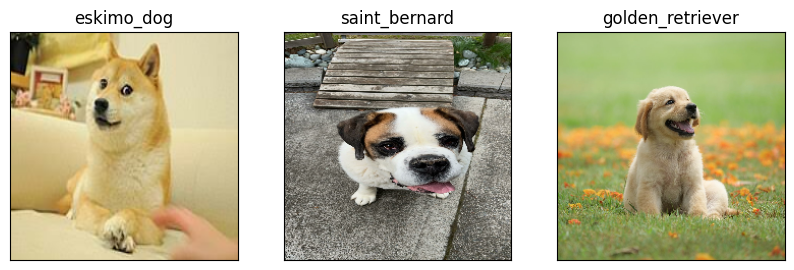

In [ ]:
# Check Custom image predictions
plt.figure(figsize=(10,10))
# enumerate counts the images in custom_images, set the count of it to i and save the images in custom_images to image variale
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)


In [ ]:
!jupyter nbconvert --execute --to html "/content/drive/MyDrive/Dog vision"